In [14]:
import jax
import jax.numpy as np
import numpy as onp
from lbi.pipeline.base import pipeline
from lbi.prior import SmoothedBoxPrior
import h5py
import torch

# from lbi.diagnostics import MMD, ROC_AUC, LR_ROC_AUC
from lbi.sampler import hmc
from lbi.dataset import getDataLoaderBuilder

from simulator import get_simulator, theta_addunits, theta_ranges

from simulator import get_simulator_with_more_observables
import limits_plots as lp

import corner
import matplotlib.pyplot as plt

from pipeline_kwargs import pipeline_kwargs

from jax.config import config

config.update("jax_disable_jit", True)

%load_ext autoreload
%autoreload 2

%matplotlib inline

%load_ext memory_profiler

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


In [15]:
def scale_X(x):
    """
    x: jax.numpy array
    """
    omega = np.atleast_2d(
        np.log10(np.clip(x[..., 0], a_min=1e-5, a_max=None)) * 2
    ).T

    gmuon = np.clip(x[..., 1], a_min=1e-11, a_max=1e-8)
    gmuon = np.atleast_2d(np.log10(gmuon) + 9.5).T

    mh = np.clip(x[..., 2], a_min=120)
    mh = np.atleast_2d((mh - 123.86377) / 2.2839).T

    out = [omega, gmuon, mh]

    if pipeline_kwargs["simulator_kwargs"]["use_direct_detection"]:
        # if exists, it'll always be 3rd
        xenon_pval = np.atleast_2d(
            np.clip(x[..., 3], a_min=None, a_max=X_true[:, 3])
        ).T
        out += [xenon_pval]

    if pipeline_kwargs["simulator_kwargs"]["use_atlas_constraints"]:
        # this will always be last
        atlas_pval = np.atleast_2d(
            np.clip(x[..., -1], a_min=None, a_max=X_true[:, -1])
        ).T
        out += [atlas_pval]

    out = np.hstack(out)

    return out

def scale_Theta(theta):
    """
    theta : jax.numpy array

    theta is uniform between 0 and 1
    """
    std = 0.70710678
    # return theta
    return (theta) / std


In [20]:
# --------------------------

seed = 1234
rng, model_rng, hmc_rng = jax.random.split(jax.random.PRNGKey(seed), num=3)

# --------------------------
# Create logger
# experiment_name = datetime.datetime.now().strftime("%s")
# experiment_name = f"{model_type}_{experiment_name}"
# logger = SummaryWriter("runs/" + experiment_name)
logger = None

# set up true model for posterior inference test

#Seems like every time I call get_simulator, the memory usage increases
simulate, obs_dim, theta_dim = get_simulator(**pipeline_kwargs["simulator_kwargs"])
# --------------------------
# The true values correspond to: omega, gmuon, mh, xenon pvals
X_true = [0.12, 251e-11, 125.0]
X_sigma = [0.005, 59e-11, 1.0]

if pipeline_kwargs["simulator_kwargs"]["use_direct_detection"]:
    X_true += [[0.5]]
    X_sigma += [1e-5]
if pipeline_kwargs["simulator_kwargs"]["use_atlas_constraints"]:
    X_true += [0.5]
    X_sigma += [1e-5]

X_true = np.array([X_true])
X_sigma = np.array(X_sigma)

print("X_true", X_true)
print("X_sigma", X_sigma)

# --------------------------
# set up prior
log_prior, sample_prior = SmoothedBoxPrior(
    theta_dim=theta_dim, lower=-1.0, upper=1.0, sigma=0.01
)

# Plot prior
lp.prior_plotter(sample_prior)

X_true [[1.20e-01 2.51e-09 1.25e+02 5.00e-01]]
X_sigma [5.0e-03 5.9e-10 1.0e+00 1.0e-05]


<Figure size 3280x3280 with 0 Axes>

In [120]:
# model, log_prob, params, Theta_post = pipeline(
#         rng,
#         X_true,
#         get_simulator,
#         # Prior
#         log_prior,
#         sample_prior,
#         # scaling
#         sigma=X_sigma,
#         scale_X=scale_X,
#         scale_Theta=scale_Theta,
#         **pipeline_kwargs,
#     )

STARTING ROUND 1


  0%|          | 0/9 [00:00<?, ?it/s]

In [5]:
num_chains_results = 4
init_theta = sample_prior(rng, num_samples=num_chains_results)

In [87]:
parallel_log_prob = jax.vmap(log_prob, in_axes=(0, None, None)) #This goes over the ensemble of classifiers
parallel_log_prob(params, X_true, init_theta).mean(axis=0)

DeviceArray([[-0.48267546]], dtype=float32)

In [89]:
parallel_apply = jax.vmap(model.apply, in_axes=(0, None, None)) #This goes over the ensemble of classifiers
parallel_apply(params, X_true, init_theta).mean(axis=0) #This should be the log probability of X given theta I think


In [22]:
%memit x = simulate(rng, init_theta, num_samples_per_theta=1) 

  0%|          | 0/1 [00:00<?, ?it/s]

1
 There has been a problem during the run.
 Please check the file Messages.out for further information.
 Block 'HMIX', key={ 2} - is absent
can not calculate parameter tB
sortOddparticles err=50


100%|██████████| 1/1 [00:01<00:00,  1.72s/it]

peak memory: 830.91 MiB, increment: 0.97 MiB


In [5]:
def simulate_w_noise(theta, sigma):
    x = simulate(rng, theta, num_samples_per_theta=1) 
    # transform to data space, add gaussian noise, transform back
    x = x + sigma * onp.random.randn(*x.shape)
    return x

In [6]:
##Try simulating from micromegas
# x_w_noise = simulate_w_noise(init_theta, X_sigma)

# nan_idx_noise = onp.any(onp.isnan(x_w_noise), axis=1)
# x_noise = x_w_noise[~nan_idx_noise]
# theta_noise = init_theta[~nan_idx_noise]

In [14]:
# def gaussian_likelihood(theta):
#     x = simulate(rng, theta, num_samples_per_theta=1) 
#     return np.exp(-0.5 * (x - X_true) ** 2 / X_sigma ** 2)

def gaussian_log_likelihood(theta):
    x = simulate(rng, theta, num_samples_per_theta=1) 
    return -0.5 * (x - X_true) ** 2 / X_sigma ** 2

In [35]:
gaussian_log_likelihood(init_theta).mean(axis=0).sum()

100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


DeviceArray(-1.2508116e+09, dtype=float32)

In [4]:
def potential_fn(theta):
    if len(theta.shape) == 1:
        theta = theta[None, :]

    log_P = log_prior(theta)
    
    # log_L = gaussian_likelihood(theta)
    # log_L = gaussian_log_likelihood(theta)

    # log_L = log_L.mean(axis=0)

    # log_post = -(log_L + log_P)
    # log_post = -(log_L)
    log_post = -(log_P)
    return log_post.sum()

# def potential_fn(theta):
#         if len(theta.shape) == 1:
#             theta = theta[None, :]

#         log_P = log_prior(theta)

#         log_L = parallel_log_prob(params, X_true, theta)
#         log_L = log_L.mean(axis=0)

#         log_post = -(log_L + log_P)
#         return log_post.sum()

num_chains_results = 32
init_theta = sample_prior(rng, num_samples=num_chains_results)

In [103]:
mcmc = hmc(
    rng,
    potential_fn,
    init_theta,
    adapt_step_size=True,
    adapt_mass_matrix=True,
    dense_mass=True,
    step_size=1e0,
    max_tree_depth=8,
    # num_warmup=2000,
    # num_samples=750,
    num_warmup=100,
    num_samples=100,
    num_chains=num_chains_results,
    extra_fields=("potential_energy",),
    chain_method="vectorized",
)
mcmc.print_summary()


sample: 100%|██████████| 200/200 [10:36<00:00,  3.18s/it]



                 mean       std    median      5.0%     95.0%     n_eff     r_hat
 Param:0[0]     -0.14      0.86     -0.75     -1.01      0.96     16.53      6.42
 Param:0[1]     -0.13      0.94     -0.88     -1.01      1.00     16.17     13.97
 Param:0[2]      0.10      0.64      0.09     -0.79      1.01     23.28      1.87
 Param:0[3]     -0.70      0.27     -0.77     -1.02     -0.30    123.06      1.12
 Param:0[4]      0.29      0.46      0.35     -0.38      1.02   1012.29      1.03
 Param:0[5]      0.45      0.39      0.52     -0.10      1.01    744.17      1.04
 Param:0[6]      0.09      0.65      0.22     -0.86      1.00     22.87      1.88
 Param:0[7]      0.58      0.39      0.69      0.01      1.02     92.14      1.15
 Param:0[8]      0.06      0.39      0.08     -0.61      0.71     79.34      1.15
 Param:0[9]     -0.04      0.48     -0.05     -0.83      0.76   1353.58      1.01
Param:0[10]      0.35      0.54      0.51     -0.51      1.02     67.31      1.20
Param:0[11]    

In [104]:
samples = mcmc.get_samples(group_by_chain=False).squeeze()
# samples are unitless. let's scale them to the true values
unitful_samples = theta_addunits(samples)
# ignore squarks
unitful_samples = np.delete(unitful_samples, slice(11, 20), 1)

posterior_log_probs = -mcmc.get_extra_fields()["potential_energy"]
unitful_samples = np.hstack([unitful_samples, posterior_log_probs[:, None]])

labels = [
    r"$\mu$",
    r"$M_1$",
    r"$M_2$",
    r"$M_3$",
    r"$M_{L_1}$",
    r"$M_{L_2}$",
    r"$M_{L_3}$",
    r"$M_{r_1}$",
    r"$M_{r_2}$",
    r"$M_{r_3}$",
    # r"$M_{Q_1}$",
    # r"$M_{Q_2}$",
    # r"$M_{Q_3}$",
    # r"$M_{u_1}$",
    # r"$M_{u_2}$",
    # r"$M_{u_3}$",
    # r"$M_{d_1}$",
    # r"$M_{d_2}$",
    # r"$M_{d_3}$",
    r"$M_A$",
    r"$\tan\beta$",
    r"$A_t$",
    r"$A_b$",
    r"$A_{\tau}$",
]
labels += ["log prob"]
ranges = [
    [-2000, 2000],
    [-1200, 1200],
    [-2000, 2000],
    [400, 4000],
    [100, 4000],
    [100, 1000],
    [100, 4000],
    [100, 4000],
    [100, 1000],
    [100, 4000],
    [400, 4000],
    [1, 50],
    [-4000, 4000],
    [-4000, 4000],
    [-4000, 4000],
]
ranges = onp.array(ranges)

ranges = np.vstack(
    [ranges, np.array([(posterior_log_probs.min(), posterior_log_probs.max())])]
)

In [105]:
unitful_samples.shape

(3200, 16)

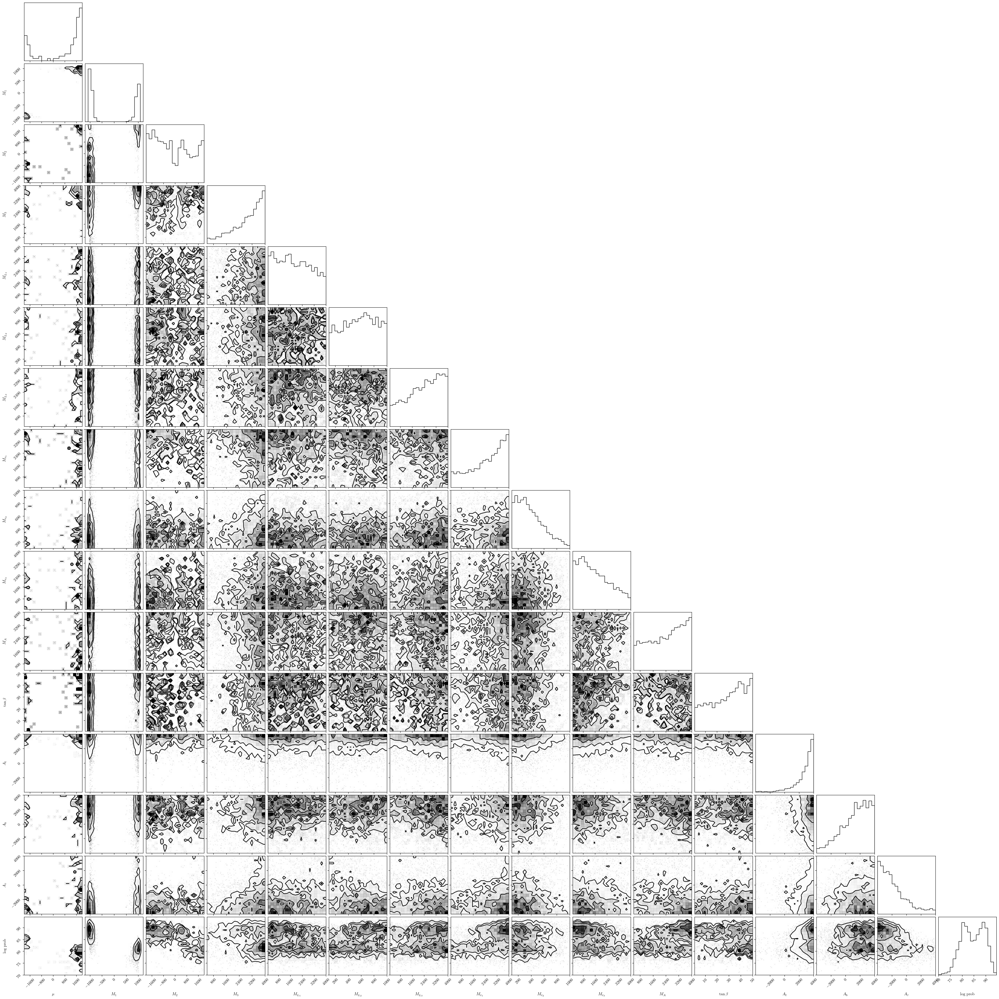

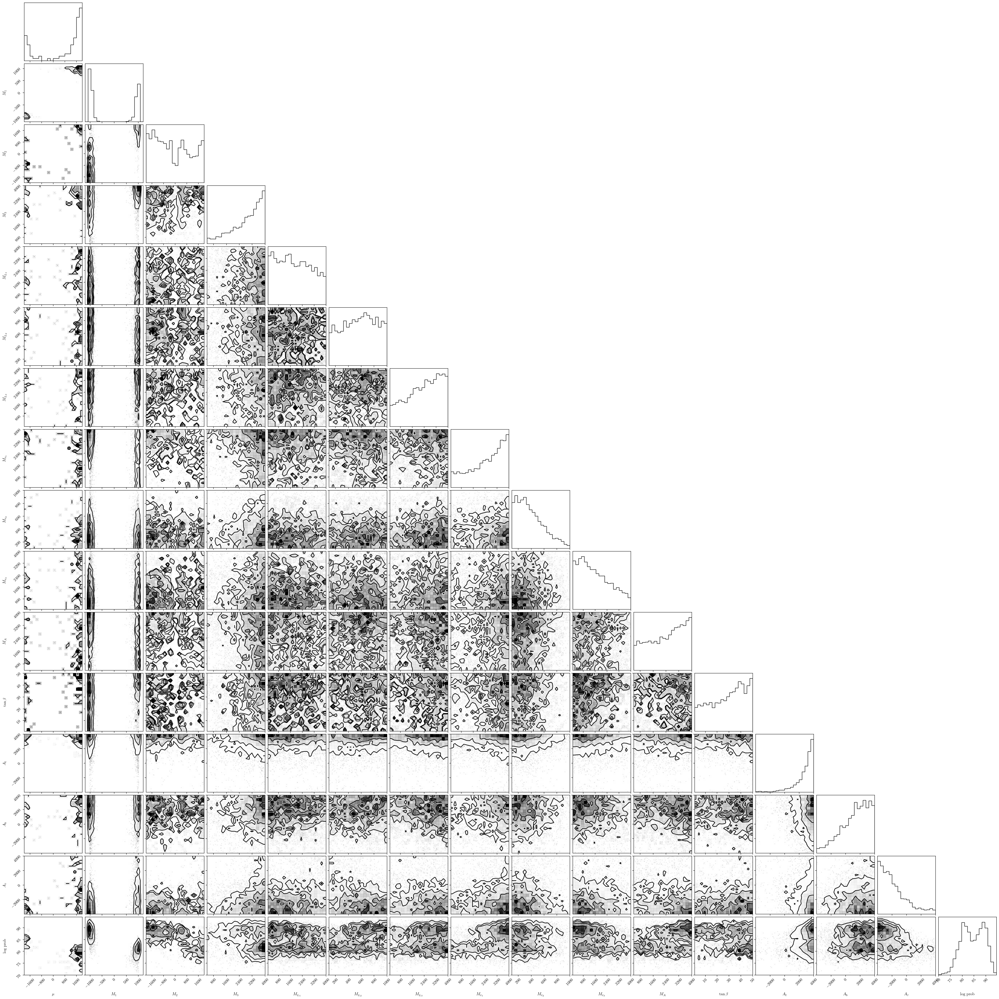

In [106]:
corner.corner(onp.array(unitful_samples), range=ranges, labels=labels)

In [111]:
# --------------------------
# --------------------------
# Run full simulations on the samples
# --------------------------

# First shuffle samples to get a random order
_, _, observables_rng = jax.random.split(rng, num=3)
samples = jax.random.shuffle(observables_rng, samples, axis=0)
# Generate the observables from 2000 samples of the posterior
big_simulator = get_simulator_with_more_observables()

# num_samples = -1  # -1 means all
num_samples = 1000  # -1 means all
results = big_simulator(rng, samples[:num_samples])


/opt/homebrew/Caskroom/miniforge/base/envs/mssm/lib/python3.10/site-packages/jax/_src/random.py:399: FutureWarning: jax.random.shuffle is deprecated and will be removed in a future release. Use jax.random.permutation with independent=True.
  warnings.warn(msg, FutureWarning)
  0%|          | 0/1 [00:00<?, ?it/s]

 There has been a problem during the run.
 Please check the file Messages.out for further information.
 There has been a problem during the run.
 Please check the file Messages.out for further information.
 Block 'HMIX', key={ 2} - is absent
can not calculate parameter tB
sortOddparticles err=50
 Block 'HMIX', key={ 2} - is absent
can not calculate parameter tB
sortOddparticles err=50
 There has been a problem during the run.
 Please check the file Messages.out for further information.
 Block 'HMIX', key={ 2} - is absent
can not calculate parameter tB
sortOddparticles err=50
 There has been a problem during the run.
 Please check the file Messages.out for further information.
 Block 'HMIX', key={ 2} - is absent
can not calculate parameter tB
sortOddparticles err=50
 There has been a problem during the run.
 Please check the file Messages.out for further information.
 Block 'HMIX', key={ 2} - is absent
can not calculate parameter tB
sortOddparticles err=50
 There has been a problem duri

100%|██████████| 1/1 [03:51<00:00, 231.02s/it]


In [ ]:
# # --------------------------
# # Save the samples and micromegas results
# # --------------------------
# samples_and_results = results
# samples_and_results["samples"] = unitful_samples[:num_samples]

# hf = h5py.File("samples_and_results_mcmc.h5", "w")
# for key, arr in samples_and_results.items():
#     hf.create_dataset(key, data=arr)
# hf.close()


In [113]:
# --------------------------
# Plot the samples and results
# --------------------------

lower_limits = onp.array(X_true - 3 * X_sigma)
# lower limit for direct detection is 3 sigma excluded
lower_limits[:, 3] = 2 * 0.02275
upper_limits = onp.array(X_true + 3 * X_sigma)
limits = onp.stack([lower_limits, upper_limits]).squeeze()

lp.M1_vs_mchi(samples[:num_samples], results)
lp.plot_observable_corner(X_true, X_sigma, results, logger=logger)
lp.plot_direct_detection_limits(
    results, logger=logger, filename="unfiltered_direct_detection_mcmc.png"
)
lp.plot_mass_splitting(
    results, logger=logger, filename="unfiltered_LHC_constraints_mcmc.png"
)
lp.plot_masses_corner(
    results, logger=logger, filename="unfiltered_masses_corner_mcmc.png"
)

filtered_unitful_samples, filtered_results = lp.filter_observables(
    unitful_samples[:num_samples], results, limits
)

print(filtered_unitful_samples.shape[0], "samples after filtering")

lp.plot_direct_detection_limits(
    filtered_results, logger=logger, filename="direct_detection_mcmc.png"
)
lp.plot_mass_splitting(
    filtered_results, logger=logger, filename="LHC_constraints_mcmc.png"
)
try:
    lp.plot_masses_corner(
        filtered_results, logger=logger, filename="masses_corner_mcmc.png"
    )
except:
    print("Could not plot masses corner")

try:
    corner.corner(onp.array(filtered_unitful_samples), range=ranges, labels=labels)

    if hasattr(logger, "plot"):
        logger.plot(f"Final Corner Plot", plt, close_plot=True)
    else:
        plt.savefig("filtered_posterior_corner_mcmc.png")
    plt.clf()
except:
    print("Could not plot filtered posterior corner")

0 samples after filtering
Could not plot masses corner
Could not plot filtered posterior corner


<Figure size 640x480 with 0 Axes>

<Figure size 760x760 with 0 Axes>

<Figure size 1180x1180 with 0 Axes>